# Creating Vulcano plots for Gene expression significance

### Load all packages

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import pandas as pd
import overlab as ol

### First cleaning data(deleting all cells with value of 0)

In [7]:
#First cleaning data --> deleting all cells with value of 0

# Load the data from the LibreOffice Calc file
file_path = '/media/msbb/ssd2/Yasmine_copy/RNA_seq_analysis/Data/Genome_for_vulcano_norm.csv'  
df = pd.read_csv(file_path)

# Define the columns with the stages
stage_columns = ['Thp1-mono-rep1', 'Thp1-mono-rep2', 'Thp1-macro-rep1', 'Thp1-macro-rep2', 'Thp1-M.tb-rep1', 'Thp1-M.tb-rep2']

# Filter out rows where all stage columns have zero values
filtered_df = df.loc[~(df[stage_columns] == 0).all(axis=1)]

# Save the filtered data to a new file
output_file_path = '/media/msbb/ssd2/Yasmine_copy/RNA_seq_analysis/Data/Genome_for_vulcanoV1.csv'  
filtered_df.to_csv(output_file_path, index=False)

print(f"Filtered file saved to {output_file_path}")


Filtered file saved to /media/msbb/ssd2/Yasmine_copy/RNA_seq_analysis/Data/Genome_for_vulcanoV1.csv


### Code for generating the data for the volcano plots

To create the volcano plots, we need to first average the repetitions. In addition, the requirements for a volcano plot are the Calculate Raw P-values, Adjusted P-values(FDR) and Log Fold Change (LogFC).
To calculate LFC treshold --> To calculate the LFC (Log Fold Change) threshold over the p-values, we use the concept of the False Discovery Rate (FDR) or apply multiple testing correction methods such as the Benjamini-Hochberg procedure. This helps in identifying a threshold that balances the trade-off between discovering true positives and controlling the rate of false positives.


In [8]:
# Load the filtered data and delete Geneid that do not have a Genename
file_path = '/media/msbb/ssd2/Yasmine_copy/RNA_seq_analysis/Data/Genome_for_vulcanoV1.csv'  # Update this with the path to your filtered file
df = pd.read_csv(file_path)
filter_df = df[df['Genename'].str.len() > 0]
filter_df.to_csv('/media/msbb/ssd2/Yasmine_copy/RNA_seq_analysis/Data/Genome_for_vulcanoV2.csv', index=False)


KeyError: 'Genename'

In [ ]:
# Function to safely perform t-tests
def perform_ttest(row, group1_cols, group2_cols):
    group1 = row[group1_cols].dropna().astype(float)
    group2 = row[group2_cols].dropna().astype(float)
   
    # Debug: print the row's values for these groups
    print(f"Row {row.name} values for group 1: {group1.values} (types: {group1.dtypes})")
    print(f"Row {row.name} values for group 2: {group2.values} (types: {group2.dtypes})")
   
    if len(group1) > 1 and len(group2) > 1:
        try:
            p_value = ttest_ind(group1, group2)[1]
            print(f"T-test result for row {row.name}: {p_value}")
            return p_value
        except Exception as e:
            print(f"Error performing t-test on row {row.name}: {e}")
            return np.nan
    else:
        print(f"Not enough data to perform t-test on row {row.name}")
        return np.nan

In [13]:
#Making volcano plot
# Load the filtered data
file_path = 'differential_expression_resultsv1.csv'  # Update this with the path to your filtered file
df = pd.read_csv(file_path)

# Define the columns corresponding to the stages
geneid_column = 'Genename'
mono_columns = ['Thp1-mono-rep1', 'Thp1-mono-rep2']
macro_columns = ['Thp1-macro-rep1', 'Thp1-macro-rep2']
mtb_columns = ['Thp1-M.tb-rep1', 'Thp1-M.tb-rep2']

# Filter significant genes for each comparison
pval_threshold = 0.05
lfc_threshold = 0.58  # Log fold change threshold for upregulation/downregulation of 1.5

# Calculate the mean expression levels for each gene in each stage
df['mean_mono'] = df[mono_columns].mean(axis=1)
df['mean_macro'] = df[macro_columns].mean(axis=1)
df['mean_mtb'] = df[mtb_columns].mean(axis=1)

# Perform t-tests between stages (Mono vs Macro and Mono vs M.tb)
df['pval_mono_vs_macro'] = df.apply(lambda row: perform_ttest(row, mono_columns, macro_columns), axis=1)
df['pval_mono_vs_mtb'] = df.apply(lambda row: perform_ttest(row, mono_columns, mtb_columns), axis=1)
df['pval_macro_vs_mtb'] = df.apply(lambda row: perform_ttest(row, macro_columns, mtb_columns), axis=1)

# Calculate log fold change (LFC) for each comparison
df['lfc_mono_vs_macro'] = np.log2(df['mean_macro'] / df['mean_mono'].replace(0, np.nan))
df['lfc_mono_vs_mtb'] = np.log2(df['mean_mtb'] / df['mean_mono'].replace(0, np.nan))
df['lfc_macro_vs_mtb'] = np.log2(df['mean_mtb'] / df['mean_macro'].replace(0, np.nan))

# Save the results to a new file
output_file_path = 'differential_expression_resultsv1.csv'
df.to_csv(output_file_path, index=False)

Data types after conversion:
Geneid                 object
Thp1-mono-rep1        float64
Thp1-mono-rep2        float64
Thp1-macro-rep1       float64
Thp1-macro-rep2       float64
Thp1-M.tb-rep1        float64
Thp1-M.tb-rep2        float64
Genename               object
mean_mono             float64
mean_macro            float64
mean_mtb              float64
pval_mono_vs_macro    float64
pval_mono_vs_mtb      float64
pval_macro_vs_mtb     float64
lfc_mono_vs_macro     float64
lfc_mono_vs_mtb       float64
lfc_macro_vs_mtb      float64
dtype: object
Row 0 values for group 1: [0. 0.] (types: float64)
Row 0 values for group 2: [0. 0.] (types: float64)
T-test result for row 0: nan
Row 1 values for group 1: [21.565256 20.377796] (types: float64)
Row 1 values for group 2: [13.622955  9.641877] (types: float64)
T-test result for row 1: 0.0460780620538088
Row 2 values for group 1: [0.026363 0.020037] (types: float64)
Row 2 values for group 2: [0.035803 0.      ] (types: float64)
T-test result fo

/home/msbb/anaconda3/envs/sci_Hi-C/lib/python3.11/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [17]:
# Create volcano plots
def volcano_plot(df, lfc_col, pval_col, geneid_column, title,comparisont_name,num_annotations = 10):
    plt.figure(figsize=(10, 8))
    plt.scatter(df[lfc_col], -np.log10(df[pval_col]), c='grey', alpha=0.5)

    # Highlight significant points
    sig_threshold = 0.05
    up_regulated = df[(df[pval_col] < sig_threshold) & (df[lfc_col] > 1.5)]
    down_regulated = df[(df[pval_col] < sig_threshold) & (df[lfc_col] < -1.5)]

    plt.scatter(up_regulated[lfc_col], -np.log10(up_regulated[pval_col]), c='red', label='Up-regulated')
    plt.scatter(down_regulated[lfc_col], -np.log10(down_regulated[pval_col]), c='blue', label='Down-regulated')

    # Annotate the top significant points

    texts=[]
    top_up = up_regulated.nsmallest(num_annotations, columns=[pval_col])
    top_down = down_regulated.nsmallest(num_annotations, columns=[pval_col])

    top_up_annotations = [(row[lfc_col], -np.log10(row[pval_col]), row['Genename']) for _, row in top_up.iterrows()] 
    top_down_annotations = [(row[lfc_col], -np.log10(row[pval_col]), row['Genename']) for _, row in top_down.iterrows()] 
    
    all_annotations = top_up_annotations + top_down_annotations 

    if all_annotations: 
       x_coords, y_coords, labels = zip(*all_annotations) 
       ol.annotate(x_coords, y_coords, labels, ax=plt.gca()) 

    #Count signifcantly up-regulated and down-regulated genes
    up_regulated1= up_regulated.replace([np.inf, -np.inf], np.nan).dropna()
    num_upregulated = len(up_regulated1)
    down_regulated1= down_regulated.replace([np.inf, -np.inf], np.nan).dropna()
    num_downregulated=len(down_regulated1)
    
    print(f'Number of significantly upregulated genes: {num_upregulated}')
    print(f'Number of significantly downregulated genes: {num_downregulated}')
    print(f'Expression score: {np.sum(up_regulated1[lfc_col])+np.sum(down_regulated1[lfc_col])}')
    

    # Save top significant genes to file
    output_file_path = '/media/msbb/ssd2/Yasmine_copy/RNA_seq_analysis/Data/{}_top_sig_genes.csv'.format(comparisont_name)
    top_genes = pd.concat([top_up, top_down])
    top_genes.to_csv(output_file_path, index=False)

   
    plt.title(title)
    plt.xlabel('Log2 Fold Change')
    plt.ylabel('-Log10 p-value')
    plt.legend()
    plt.show()

/home/msbb/anaconda3/envs/sci_Hi-C/lib/python3.11/site-packages/overlab/overlab.py:41: RuntimeWarning: invalid value encountered in scalar subtract
  factor=0.2*(bbox_data[0,0]-bbox_data[1,0])


Number of significantly upregulated genes: 1134
Number of significantly downregulated genes: 1776
Expression score: -805.1808703322904


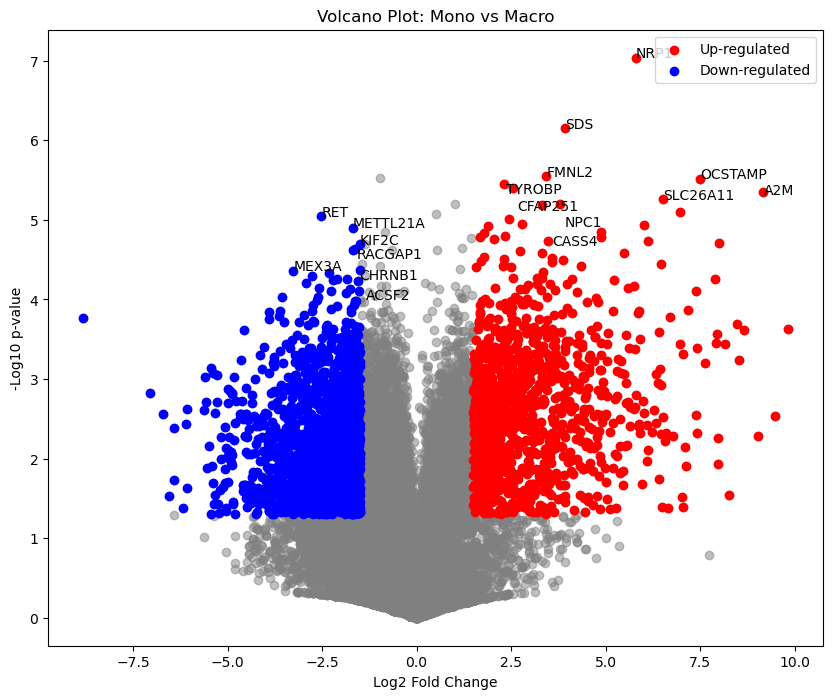

/home/msbb/anaconda3/envs/sci_Hi-C/lib/python3.11/site-packages/overlab/overlab.py:41: RuntimeWarning: invalid value encountered in scalar subtract
  factor=0.2*(bbox_data[0,0]-bbox_data[1,0])


Number of significantly upregulated genes: 1715
Number of significantly downregulated genes: 3906
Expression score: -4530.83680297703


<Figure size 640x480 with 0 Axes>

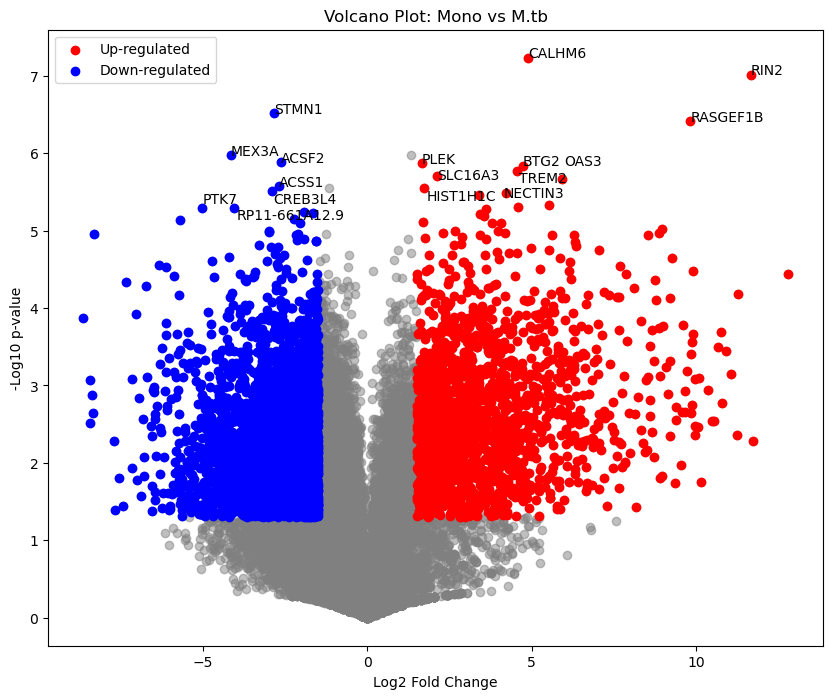

Number of significantly upregulated genes: 1025
Number of significantly downregulated genes: 1261
Expression score: 84.63277695685338


<Figure size 640x480 with 0 Axes>

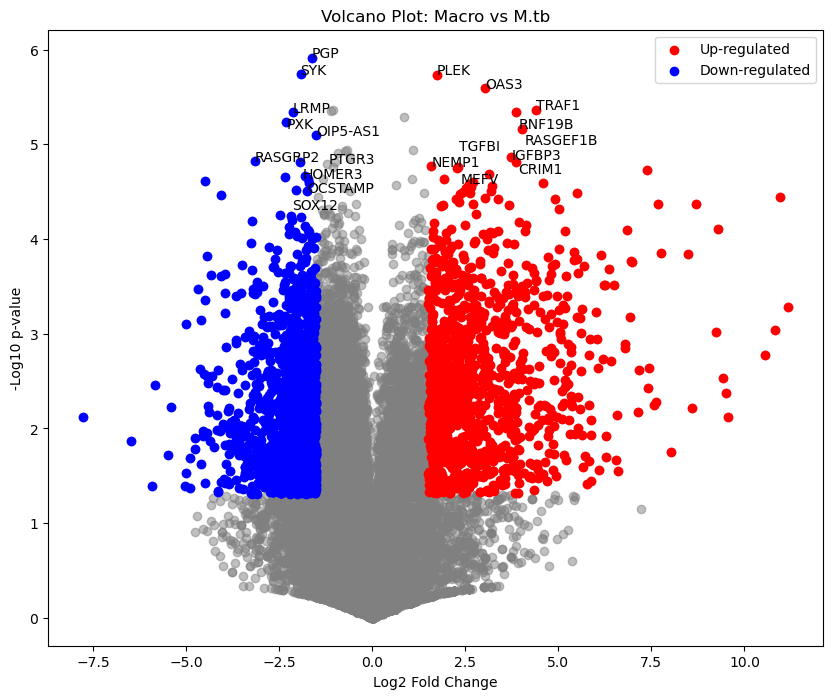

<Figure size 640x480 with 0 Axes>

In [18]:
# Plot for Mono vs Macro
volcano_plot(df, lfc_col='lfc_mono_vs_macro', pval_col='pval_mono_vs_macro', geneid_column=['Geneid'], title='Volcano Plot: Mono vs Macro', comparisont_name = "Mono_vs_Macro")
plt.savefig('/home/msbb/Figures_for_thesis//Volcano_MonovsMacro')

# Plot for Mono vs M.tb
volcano_plot(df, lfc_col='lfc_mono_vs_mtb', pval_col='pval_mono_vs_mtb', geneid_column=['Geneid'], title='Volcano Plot: Mono vs M.tb', comparisont_name = "Mono_vs_Mtb")
plt.savefig('/home/msbb/Figures_for_thesis//Volcano_MonovsMtb')
# Plot for Macro vs M.tb
volcano_plot(df, lfc_col='lfc_macro_vs_mtb', pval_col='pval_macro_vs_mtb', geneid_column=['Geneid'], title='Volcano Plot: Macro vs M.tb', comparisont_name = "Macro_vs_Mtb")

# volcano_plot(df, lfc_col='lfc_macro_vs_mtb', pval_col='pval_macro_vs_mtb', geneid_column=['Geneid'], title='Volcano Plot: Macro vs M.tb', comparisont_name = "Macro_vs_Mtb")
plt.savefig('/home/msbb/Figures_for_thesis/Volcano_MacrovsMtb')

### Saving significant results

In [23]:
# Filter significant genes for each comparison
pval_threshold = 0.05
lfc_threshold = 0.58 # Log fold change threshold for upregulation/downregulation of 1.5

# Mono vs Macro
significant_genes_mono_vs_macro = df[(df['pval_mono_vs_macro'] < pval_threshold) & (abs(df['lfc_mono_vs_macro']) > lfc_threshold)]

# Mono vs M.tb
significant_genes_mono_vs_mtb = df[(df['pval_mono_vs_mtb'] < pval_threshold) & (abs(df['lfc_mono_vs_mtb']) > lfc_threshold)]

# Macro vs M.tb
significant_genes_macro_vs_mtb = df[(df['pval_macro_vs_mtb'] < pval_threshold) & (abs(df['lfc_macro_vs_mtb']) > lfc_threshold)]

# Save significant genes to new CSV files
if not significant_genes_mono_vs_macro.empty:
    significant_genes_mono_vs_macro.to_csv('significant_genes_mono_vs_macro.csv', index=False)
    print("Significant genes for Mono vs Macro saved to significant_genes_mono_vs_macro.csv")
else:
    print("No significant genes found for Mono vs Macro with the current thresholds.")

if not significant_genes_mono_vs_mtb.empty:
    significant_genes_mono_vs_mtb.to_csv('significant_genes_mono_vs_mtb.csv', index=False)
    print("Significant genes for Mono vs M.tb saved to significant_genes_mono_vs_mtb.csv")
else:
    print("No significant genes found for Mono vs M.tb with the current thresholds.")

if not significant_genes_macro_vs_mtb.empty:
    significant_genes_macro_vs_mtb.to_csv('significant_genes_macro_vs_mtb.csv', index=False)
    print("Significant genes for Macro vs M.tb saved to significant_genes_macro_vs_mtb.csv")
else:
    print("No significant genes found for Macro vs M.tb with the current thresholds.")

Significant genes for Mono vs Macro saved to significant_genes_mono_vs_macro.csv
Significant genes for Mono vs M.tb saved to significant_genes_mono_vs_mtb.csv
Significant genes for Macro vs M.tb saved to significant_genes_macro_vs_mtb.csv
